# Машинное обучение, ВМК МГУ

# Практическое задание 3. Обучение без учителя.

## Общая информация
Дата выдачи: 15.04.2021 23:59MSK

Мягкий дедлайн: 29.04.2021 23:59 MSK

Жёсткий дедлайн: 06.05.2021 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу (без учета бонусов) — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-03-Username.ipynb

Username — ваша фамилия на латинице

<p style="color:#de3815;font-size:25px;">
Напоминание об оформлении и выполнении ноутбука
</p>

* Все строчки должны быть выполнены. Нужно, чтобы output команды можно было увидеть, не запуская ячейки (кроме редких случаев, когда необходимо намеренно скрыть ненужный output, про такие случаи желательно писать пояснения в тексте). **В противном случае -1 балл**
* При оформлении ДЗ нужно пользоваться данным файлом в качестве шаблона. Не нужно удалять и видоизменять написанный код и текст, если явно не указана такая возможность. **В противном случае -1 балл**
* В anytask обязательно нужно прикреплять отдельно файл с расширением ipynb (не в архиве, а именно отдельно). Если необходимо отправить еще какие-то файлы, то вынесите их в отдельный архив (если файлов много) и пришлите. **В противном случае -0.5 балла**
---
* Пишите, пожалуйста, выводы и ответы на вопросы в текстовых ячейках/при помощи print в коде. При их отсутствии мы не можем понять, сделали ли вы задание и понимаете, что происходит, и **поэтому будем снижать баллы**
* Если алгоритм не сказано реализовывать явно, его всегда можно импортировать из библиотеки.
---
* Про графики. _Штрафы будут применяться к каждому результату команды отображения графика (plt.show() и др. аналогичные). Исключением являются графики, генерируемые функциями каких-либо сторонних библиотек, если их нельзя кастомизировать_

    * должно быть название (plt.title) графика; **В противном случае &ndash; -0.05 балла**
    * на графиках должны быть подписаны оси (plt.xlabel, plt.ylabel); **В противном случае &ndash; -0.025 балла за каждую ось**
    * должны быть подписаны единицы измерения (если это возможно); **В противном случае &ndash; -0.025 балла за каждую ось**
    * все названия должны быть понятны любому человеку, знакомому с терминологией, без заглядывания в код; **В противном случае &ndash; -0.05 балла**
    * подписи тиков на осях не должны сливаться как на одной оси, так и между ними; **В противном случае &ndash; -0.025 балла за каждую ось**
    * если изображено несколько сущностей на одном холсте (например несколько функций), то необходима поясняющая легенда (plt.legend); **В противном случае &ndash; -0.05 балла**
    * все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном); **В противном случае &ndash; -0.05 балла**
    * если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах);
    * графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно.
    * при необходимости улучшения наглядности графиков, можно пользоваться логарифмической шкалой по осям x/y.
    

### Нововведение!

* Для удобства поиска вопросов, на которые от вас просят ответа, мы пометили их знаком (?)
* Даем до +0.3 баллов за выдающиеся успехи по субъективному мнению проверяющих. Этот бонус не апеллируется

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



**Замечание:**
* seed менять нежелательно

In [79]:
import pandas as pd
import numpy as np
import folium
from collections import defaultdict
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

np.random.seed(0xFFFFFFF)

**Задание 0 (0.05 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму👺 (можно картинкой или мемом).

Хорошая домашка, особенно второе задание.

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции/семинаре. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        
        L = np.diag(np.sum(X, axis=1)) - X
        e, v = np.linalg.eig(L)
        e = e.astype(np.float64)
        v = v.astype(np.float64)
        v = v.T[np.argsort(e)].T[:, 0:self.n_components]
        return v

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [5]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

<ipython-input-4-7d4f4bade69c>:40: ComplexWarning: Casting complex values to real discards the imaginary part
  e = e.astype(np.float64)
<ipython-input-4-7d4f4bade69c>:41: ComplexWarning: Casting complex values to real discards the imaginary part
  v = v.astype(np.float64)


**Замечание**
* Для возможности получения **полного балла** assert должны проходить

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

**Замечание**
* (?) Напишите, пожалуйста, откуда в итоге скачивали данные. 

По первой ссылке.

In [3]:
data = pd.read_excel('transport.xlsx', engine='openpyxl', index_col=0)
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


In [4]:
data.shape

(1037, 15)

Воспользуемся библиотекой `folium` для визуализации данных.

In [108]:
map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map_)
map_

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [5]:
data.values[0]

array([347, '«2-й Лесной пер.», улица Бутырский Вал (347)', 37.58658429,
       55.78210613, 'улица Бутырский Вал',
       "Czentral`ny'j administrativny'j okrug", 'Tverskoj rajon',
       'АТ18; А12; АТ56; АТ78', '2-й Лесной пер.', nan, 'да',
       'ГУП «Мосгортранс»', 'active', 889085436, nan], dtype=object)

In [6]:
data.loc[1]['Longitude_WGS84_en']

37.590714

In [7]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    
    res = defaultdict(list)
    for index, line in enumerate(data.values):
        for station in line[7].split('; '):
            res[station].append(index)
    return res


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    
    res = dict()
    for key, value in routes.items():
        stops = value.copy()
        list_temp = []
        max_distance = -1
        first_stop = stops[0]
        for stop1 in stops:
            distance = 0
            for stop2 in stops:
                if stop1 != stop2:
                    distance += np.sqrt((data.loc[stop1]['Longitude_WGS84_en'] - data.loc[stop2]['Longitude_WGS84_en']) ** 2 + (data.loc[stop1]['Latitude_WGS84_en'] - data.loc[stop2]['Latitude_WGS84_en']) ** 2)
            if distance > max_distance:
                max_distance = distance
                first_stop = stop1
        list_temp.append(first_stop)
        stops.remove(first_stop)
        while len(stops) > 0:
            min_distance = np.sqrt((data.loc[stops[0]]['Longitude_WGS84_en'] - data.loc[list_temp[-1]]['Longitude_WGS84_en']) ** 2 + (data.loc[stops[0]]['Latitude_WGS84_en'] - data.loc[list_temp[-1]]['Latitude_WGS84_en']) ** 2)
            next_stop = stops[0]
            for stop in stops[1:]:
                distance = np.sqrt((data.loc[stop]['Longitude_WGS84_en'] - data.loc[list_temp[-1]]['Longitude_WGS84_en']) ** 2 + (data.loc[stop]['Latitude_WGS84_en'] - data.loc[list_temp[-1]]['Latitude_WGS84_en']) ** 2)
                if distance < min_distance:
                    min_distance = distance
                    next_stop = stop
            list_temp.append(next_stop)
            stops.remove(next_stop)
        res[key] = list_temp
    return res


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    
    res = np.zeros((data.shape[0], data.shape[0]), dtype=np.int64)
    for stops_in_route in sorted_routes.values():
        for i in range(len(stops_in_route) - 1):
            res[stops_in_route[i], stops_in_route[i + 1]] += 1
            res[stops_in_route[i + 1], stops_in_route[i]] += 1
    return res

In [8]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [9]:
adjacency_matrix.shape

(1037, 1037)

In [116]:
map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map_)

map_

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [46]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    
    colors = [
    'red',
    'blue',
    'black',
    'green',
    'orange',
    'purple',
    'darkred',
    'darkblue',
    'darkgreen',
    'lightgreen',
    'lightblue',
    'darkpurple',
    'pink',
    'cadetblue',
    'lightgray',
    'lightred',
    'gray'
    ]
    if np.unique(labels).shape[0] > len(colors):
        raise Exception('Too many labels')
    
    map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        color = colors[labels[id]]
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en], radius=10, color=color).add_to(map_)
    return map_

**Задание 1.4 (1.5 балла)**. 

* **(0.25 балла)** Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. В этом пункте используйте дефолтные параметры.
* **(0.25 балла)** Визуализируйте результат кластеризации из предыдущего пункта с помощью функции `draw_clustered_map`.
* **(0.75 балла)** А теперь подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации. Визуализируйте полученные результаты для всех трех алгоритмов на *оптимальных параметрах*
* (?) Проинтерпретируйте полученные результаты.
 * **(0.1 балла)** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?
 * **(0.1 балла)** Какие плюсы и минусы есть у каждого алгоритма?
 * **(0.05 балла)** Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).
* Обращайте внимание на баланс объектов в кластерах.

In [24]:
kmeans = KMeans(n_clusters=8)
dbscan = DBSCAN(eps=0.5, min_samples=5, metric='euclidean')

In [25]:
X_coords = data[['Longitude_WGS84_en', 'Latitude_WGS84_en']].values

In [26]:
labels_kmeans = kmeans.fit_predict(X_coords)

In [29]:
np.unique(labels_kmeans).shape[0]

8

In [47]:
map_kmeans = draw_clustered_map(data, labels_kmeans)

In [48]:
map_kmeans

In [36]:
labels_dbscan = dbscan.fit_predict(X_coords)

In [37]:
np.unique(labels_dbscan).shape[0]

1

In [49]:
map_dbscan = draw_clustered_map(data, labels_dbscan)

In [50]:
map_dbscan

In [40]:
graph_clustering = GraphClustering()
labels_graph = graph_clustering.fit_predict(adjacency_matrix)

In [51]:
np.unique(labels_graph).shape[0]

8

In [52]:
map_graph = draw_clustered_map(data, labels_graph)

In [53]:
map_graph

In [62]:
kmeans = KMeans(n_clusters=10)
labels_kmeans = kmeans.fit_predict(X_coords)
map_kmeans = draw_clustered_map(data, labels_kmeans)
map_kmeans

In [81]:
dbscan = DBSCAN(eps=0.0041, min_samples=5, metric='euclidean')
labels_dbscan = dbscan.fit_predict(X_coords)
map_dbscan = draw_clustered_map(data, labels_dbscan)
map_dbscan

In [82]:
np.unique(labels_dbscan).shape[0]

15

In [125]:
graph_clustering = GraphClustering(n_clusters=10, n_components=18)
labels_graph = graph_clustering.fit_predict(adjacency_matrix)
map_graph = draw_clustered_map(data, labels_graph)
map_graph

**Ваш ответ здесь:**

**Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?**

У KMeans кластеры выпуклые, а разбиение получается как будто просто разрезали на равные части. DBSCAN объединяет в кластеры плотно расположенные друг к другу группы точек. В спектральной кластеризации прослеживается объединение в кластеры точек, лежащих на одном маршруте.

**Какие плюсы и минусы есть у каждого алгоритма?**

KMeans очень быстро работает, следовательно подходит для работы с большими данными. Так же KMeans хорошо разделяет выпуклые непересекающиеся кластеры. DBSCAN может находить невыпуклые кластеры сложной структуры, сам определяет количество кластеров и находит выбросы. Алгоритм спектральной кластеризации работает дольше KMeans и DBSCAN, зато может учитывать более сложные признаки, например принадлежность одному маршруту.

**Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?**

Алгоритм спектральной кластеризации, потому что он учитывает маршруты.

-----

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [3]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть🙈, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [4]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [5]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Илья\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Илья\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Илья\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [7]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [8]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

In [9]:
data

,category,filename,title,content,raw_text,text
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...
...,...,...,...,...,...,...
2220,tech,397.txt,BT program to beat dialler scams,BT is introducing two initiatives to help bea...,BT program to beat dialler scams BT is introdu...,bt program beat dialler scam bt introducing tw...
2221,tech,398.txt,Spam e-mails tempt net shoppers,Computer users across the world continue to i...,Spam e-mails tempt net shoppers Computer users...,spam tempt net shopper computer user across wo...
2222,tech,399.txt,Be careful how you code,A new European directive could put software w...,Be careful how you code A new European directi...,careful code new european directive could put ...
2223,tech,400.txt,US cyber security chief resigns,The man making sure US computer networks are ...,US cyber security chief resigns The man making...,u cyber security chief resigns man making sure...


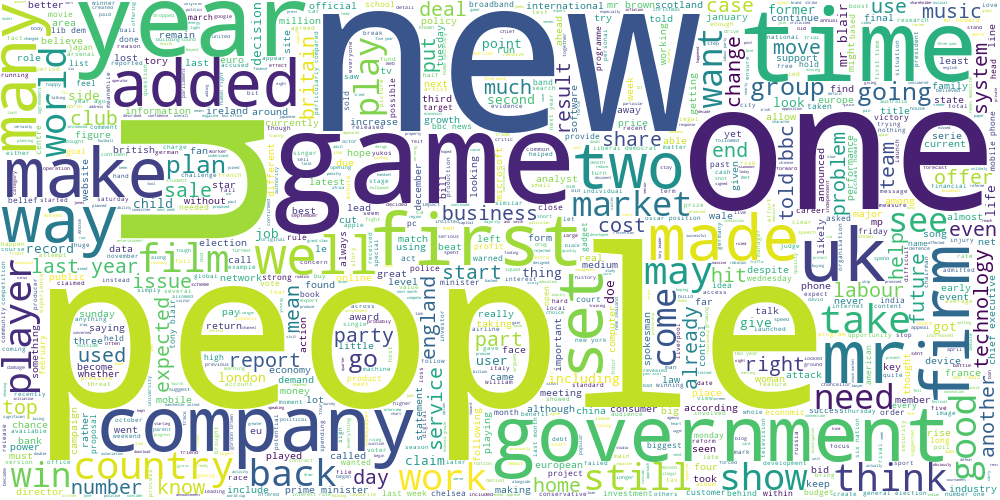

In [137]:
draw_wordcloud(data.text)

-----

**Задание 2.1 (1 балл).** 

* **(0.5 балла)** Обучите алгоритм K-Means на tf-idf представлениях текстов. 
* **(0.25 балла)** Постройте облака тегов для текстов из разных кластеров.
* **(0.25 балла)** (?) Получились ли темы интерпретируемыми? (?) Попробуйте озаглавить каждую тему.

**Подсказки:**
* Можно использовать готовую реализацию tf-idf векторайзера из sklearn
* При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова.
* Воздержитесь от использования N-грамм при обучении tf-idf.
* Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8).

**Ключевые слова:**
* *TfidfVectorizer*

In [10]:
tfidf_vec = TfidfVectorizer(max_df=1.0, min_df=0.01, use_idf=True, smooth_idf=True, sublinear_tf=False)
tfidf_texts = tfidf_vec.fit_transform(data.text)

In [11]:
tfidf_texts.shape

(2225, 2624)

In [153]:
kmeans = KMeans(n_clusters=8)
labels_kmeans = kmeans.fit_predict(tfidf_texts)

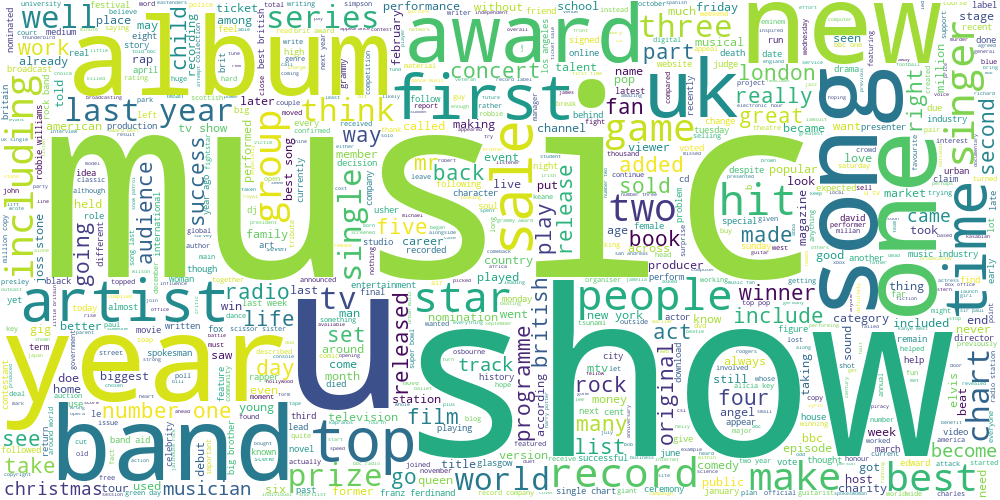

In [159]:
draw_wordcloud(data.text.values[labels_kmeans == 0])

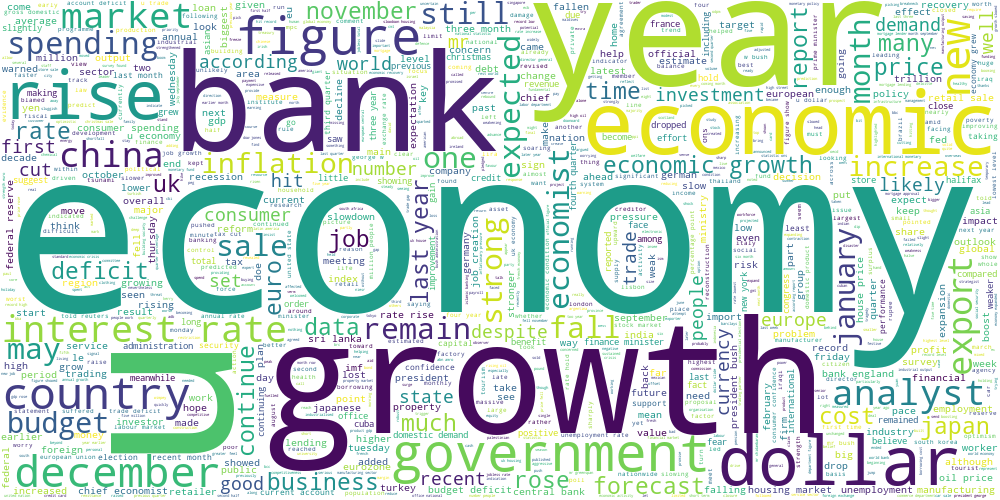

In [160]:
draw_wordcloud(data.text.values[labels_kmeans == 1])

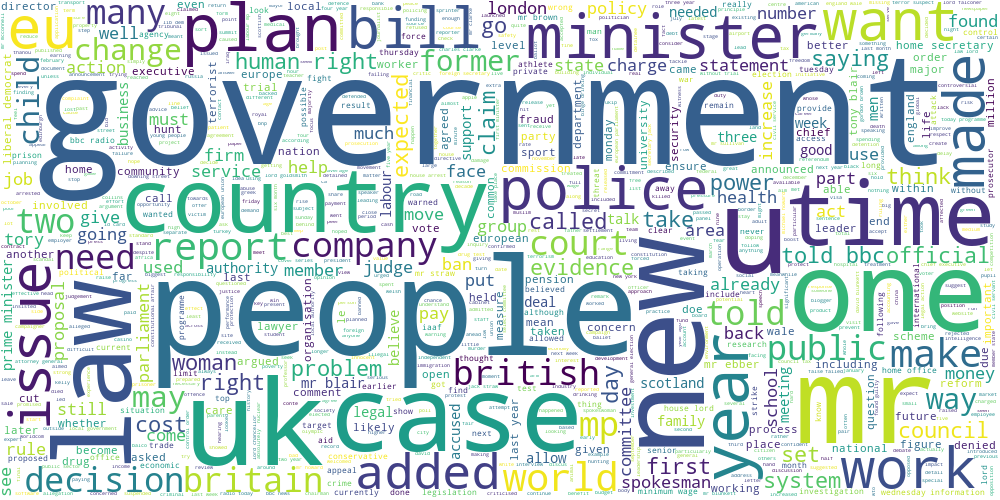

In [161]:
draw_wordcloud(data.text.values[labels_kmeans == 2])

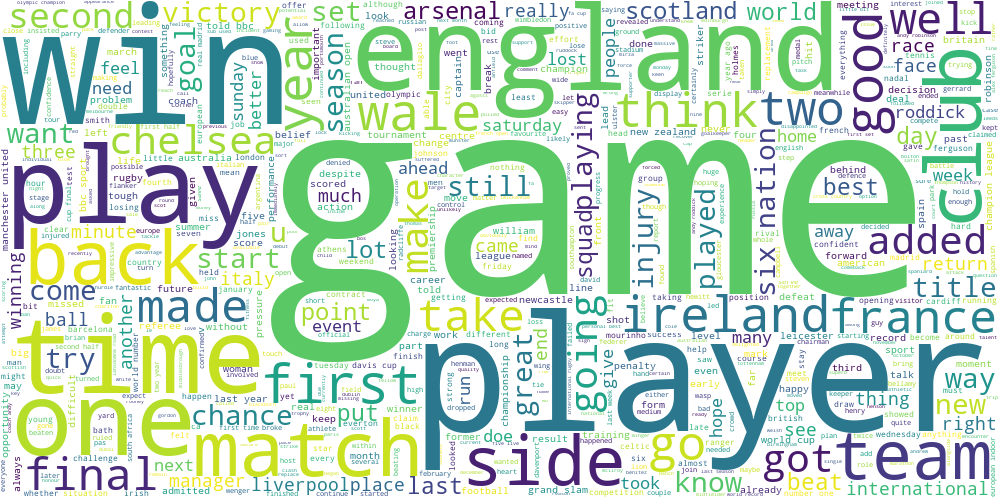

In [162]:
draw_wordcloud(data.text.values[labels_kmeans == 3])

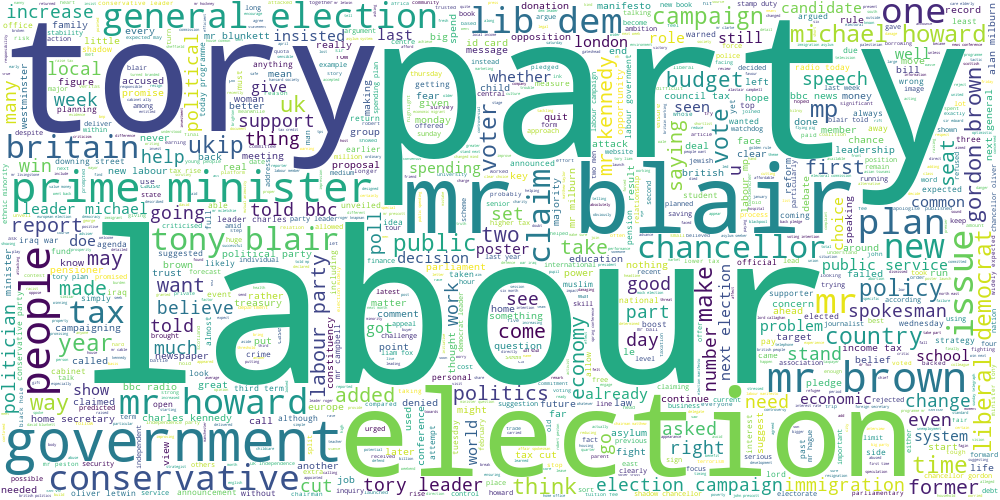

In [163]:
draw_wordcloud(data.text.values[labels_kmeans == 4])

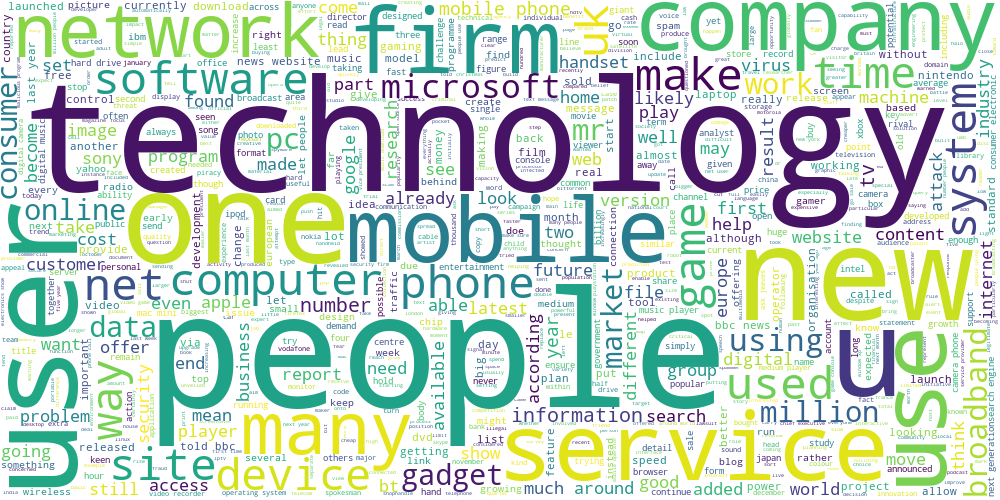

In [164]:
draw_wordcloud(data.text.values[labels_kmeans == 5])

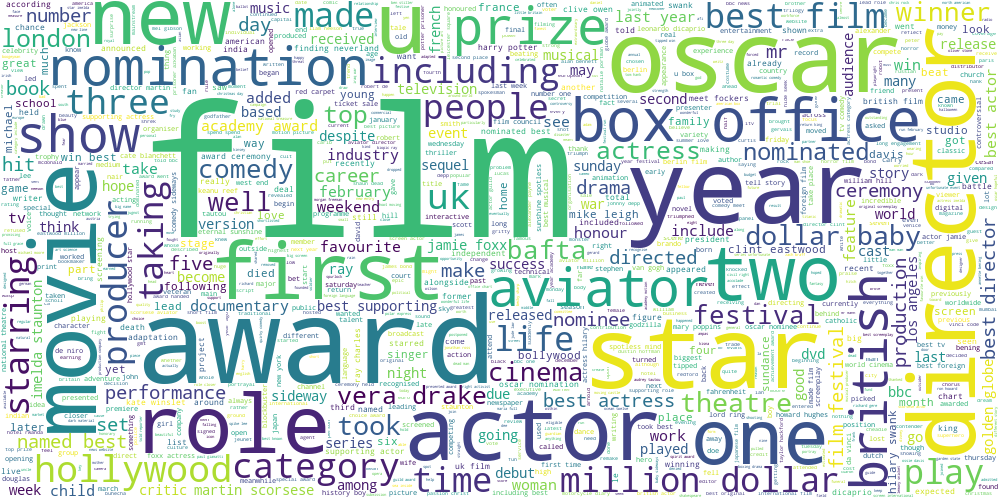

In [165]:
draw_wordcloud(data.text.values[labels_kmeans == 6])

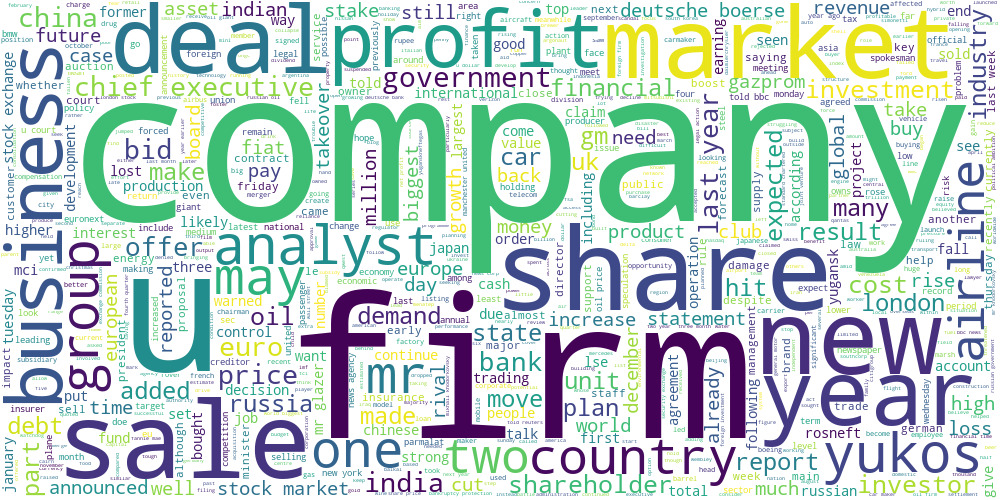

In [166]:
draw_wordcloud(data.text.values[labels_kmeans == 7])

**Ваш ответ здесь:**

Да, темы получились интерпретируемые. Темы каждого из 8 кластеров: музыка, экономика, правительство, спорт, выборы, технологии, фильмы, бизнес.

-----

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. 

* **(0.3 балла)** Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков tf-idf максимальны.
* **(0.2 балла)** (?) Согласуются ли полученные слова с облаками тегов из прошлого задания?

In [167]:
cluster_centers = kmeans.cluster_centers_ 

In [171]:
tfidf_vec.vocabulary_

{'ad': 28,
 'sale': 2022,
 'boost': 281,
 'time': 2387,
 'profit': 1789,
 'medium': 1446,
 'giant': 1011,
 'jumped': 1266,
 'three': 2378,
 'month': 1492,
 'december': 602,
 'firm': 925,
 'one': 1584,
 'biggest': 258,
 'investor': 1223,
 'google': 1028,
 'internet': 1214,
 'connection': 500,
 'higher': 1094,
 'advert': 43,
 'fourth': 965,
 'quarter': 1838,
 'rose': 2002,
 'gain': 989,
 'le': 1321,
 'user': 2485,
 'friday': 974,
 'owns': 1626,
 'business': 324,
 'mixed': 1482,
 'fortune': 957,
 'lost': 1388,
 'subscriber': 2272,
 'lower': 1392,
 'however': 1128,
 'company': 471,
 'item': 1237,
 'back': 202,
 'stronger': 2259,
 'advertising': 44,
 'revenue': 1979,
 'hope': 1113,
 'increase': 1166,
 'offering': 1572,
 'online': 1586,
 'service': 2091,
 'free': 970,
 'customer': 575,
 'try': 2438,
 'sign': 2122,
 'existing': 831,
 'broadband': 308,
 'also': 89,
 'result': 1968,
 'following': 941,
 'security': 2059,
 'exchange': 827,
 'commission': 462,
 'close': 436,
 'slightly': 2147,
 'b

In [179]:
tfidf_map = dict()
for key, value in tfidf_vec.vocabulary_.items():
    tfidf_map[value] = key

In [180]:
tfidf_map

{28: 'ad',
 2022: 'sale',
 281: 'boost',
 2387: 'time',
 1789: 'profit',
 1446: 'medium',
 1011: 'giant',
 1266: 'jumped',
 2378: 'three',
 1492: 'month',
 602: 'december',
 925: 'firm',
 1584: 'one',
 258: 'biggest',
 1223: 'investor',
 1028: 'google',
 1214: 'internet',
 500: 'connection',
 1094: 'higher',
 43: 'advert',
 965: 'fourth',
 1838: 'quarter',
 2002: 'rose',
 989: 'gain',
 1321: 'le',
 2485: 'user',
 974: 'friday',
 1626: 'owns',
 324: 'business',
 1482: 'mixed',
 957: 'fortune',
 1388: 'lost',
 2272: 'subscriber',
 1392: 'lower',
 1128: 'however',
 471: 'company',
 1237: 'item',
 202: 'back',
 2259: 'stronger',
 44: 'advertising',
 1979: 'revenue',
 1113: 'hope',
 1166: 'increase',
 1572: 'offering',
 1586: 'online',
 2091: 'service',
 970: 'free',
 575: 'customer',
 2438: 'try',
 2122: 'sign',
 831: 'existing',
 308: 'broadband',
 89: 'also',
 1968: 'result',
 941: 'following',
 2059: 'security',
 827: 'exchange',
 462: 'commission',
 436: 'close',
 2147: 'slightly',
 25

In [169]:
cluster_centers.shape

(8, 2624)

In [183]:
tfidf_map[np.argsort(cluster_centers[0])[-1]], tfidf_map[np.argsort(cluster_centers[0])[-2]], tfidf_map[np.argsort(cluster_centers[0])[-3]]

('music', 'show', 'band')

In [184]:
tfidf_map[np.argsort(cluster_centers[1])[-1]], tfidf_map[np.argsort(cluster_centers[1])[-2]], tfidf_map[np.argsort(cluster_centers[1])[-3]]

('economy', 'growth', 'rate')

In [185]:
tfidf_map[np.argsort(cluster_centers[2])[-1]], tfidf_map[np.argsort(cluster_centers[2])[-2]], tfidf_map[np.argsort(cluster_centers[2])[-3]]

('mr', 'government', 'would')

In [186]:
tfidf_map[np.argsort(cluster_centers[3])[-1]], tfidf_map[np.argsort(cluster_centers[3])[-2]], tfidf_map[np.argsort(cluster_centers[3])[-3]]

('game', 'player', 'england')

In [187]:
tfidf_map[np.argsort(cluster_centers[4])[-1]], tfidf_map[np.argsort(cluster_centers[4])[-2]], tfidf_map[np.argsort(cluster_centers[4])[-3]]

('mr', 'labour', 'election')

In [188]:
tfidf_map[np.argsort(cluster_centers[5])[-1]], tfidf_map[np.argsort(cluster_centers[5])[-2]], tfidf_map[np.argsort(cluster_centers[5])[-3]]

('mobile', 'phone', 'technology')

In [189]:
tfidf_map[np.argsort(cluster_centers[6])[-1]], tfidf_map[np.argsort(cluster_centers[6])[-2]], tfidf_map[np.argsort(cluster_centers[6])[-3]]

('film', 'award', 'best')

In [190]:
tfidf_map[np.argsort(cluster_centers[7])[-1]], tfidf_map[np.argsort(cluster_centers[7])[-2]], tfidf_map[np.argsort(cluster_centers[7])[-3]]

('company', 'firm', 'share')

**Ваш ответ здесь:**

Да, согласуются, причем довольно точно.

-----

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). 

* п.1 Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации. 
 * **(0.3 балла)** При этом для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров;
 * **(0.5 балла)** Подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.
* п.2 **(0.5 балла)** Обучите двухмерные t-SNE ([Почитать можно тут, часть 2](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture11-unsupervised.pdf), а также посмотреть непосредственно в [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)) представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом.
* п.3 **(0.2 балла)** (?) Прокомментируйте получившиеся результаты. (?) Какой баланс кластеров получился у разных методов? (?) Соотносятся ли визуализации для текстов с визуализациями для географических данных?


**Замечания:**
* В этом задании используйте реализации спектральной кластеризации и t-SNE из `sklearn`
* В п.2 Лучше всего расположить визуализации на одном графике на трех разных сабплотах. 

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [192]:
kmeans = KMeans(n_clusters=8)
labels_kmeans = kmeans.fit_predict(tfidf_texts)

In [195]:
spectral = SpectralClustering(n_clusters=8, gamma=1.0, affinity='rbf', n_neighbors=10)
labels_spectral = spectral.fit_predict(tfidf_texts)

In [258]:
dbscan = DBSCAN(eps=1.172, min_samples=5, metric='euclidean')
labels_dbscan = dbscan.fit_predict(tfidf_texts)

In [259]:
np.unique(labels_dbscan).shape[0]

8

In [217]:
tsne = TSNE(n_components=2, perplexity=30.0, early_exaggeration=12.0, learning_rate=200.0, n_iter=1000)
two_dim_texts = tsne.fit_transform(tfidf_texts)

In [219]:
two_dim_texts.shape

(2225, 2)

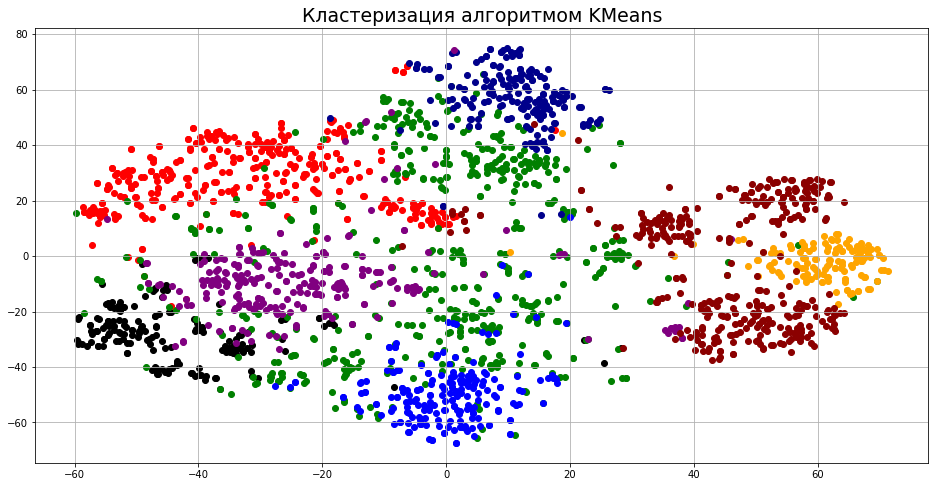

In [226]:
fig = plt.figure(figsize=(16, 8))
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 0], two_dim_texts[:, 1][labels_kmeans == 0], c='black')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 1], two_dim_texts[:, 1][labels_kmeans == 1], c='red')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 2], two_dim_texts[:, 1][labels_kmeans == 2], c='green')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 3], two_dim_texts[:, 1][labels_kmeans == 3], c='blue')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 4], two_dim_texts[:, 1][labels_kmeans == 4], c='orange')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 5], two_dim_texts[:, 1][labels_kmeans == 5], c='darkblue')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 6], two_dim_texts[:, 1][labels_kmeans == 6], c='purple')
plt.scatter(two_dim_texts[:, 0][labels_kmeans == 7], two_dim_texts[:, 1][labels_kmeans == 7], c='darkred')
plt.title('Кластеризация алгоритмом KMeans', fontsize=19)
plt.grid()
plt.show()

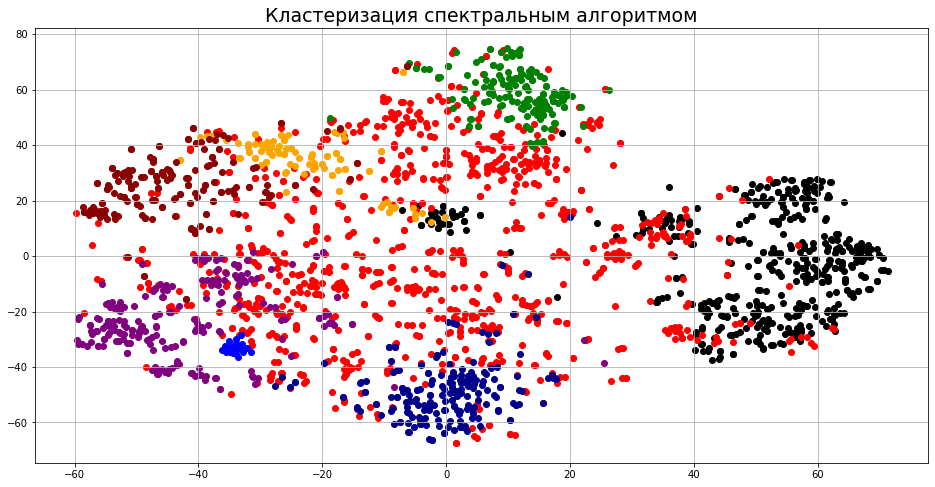

In [227]:
fig = plt.figure(figsize=(16, 8))
plt.scatter(two_dim_texts[:, 0][labels_spectral == 0], two_dim_texts[:, 1][labels_spectral == 0], c='black')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 1], two_dim_texts[:, 1][labels_spectral == 1], c='red')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 2], two_dim_texts[:, 1][labels_spectral == 2], c='green')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 3], two_dim_texts[:, 1][labels_spectral == 3], c='blue')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 4], two_dim_texts[:, 1][labels_spectral == 4], c='orange')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 5], two_dim_texts[:, 1][labels_spectral == 5], c='darkblue')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 6], two_dim_texts[:, 1][labels_spectral == 6], c='purple')
plt.scatter(two_dim_texts[:, 0][labels_spectral == 7], two_dim_texts[:, 1][labels_spectral == 7], c='darkred')
plt.title('Кластеризация спектральным алгоритмом', fontsize=19)
plt.grid()
plt.show()

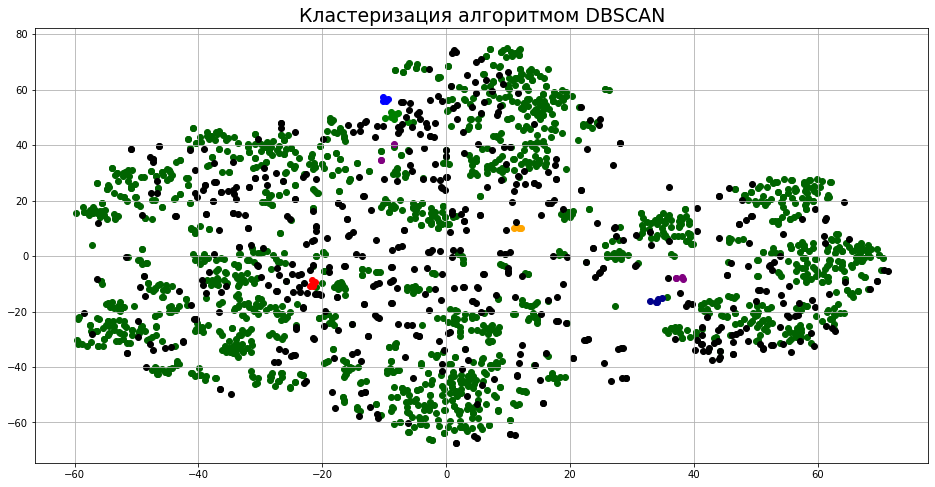

In [260]:
fig = plt.figure(figsize=(16, 8))
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 0], two_dim_texts[:, 1][labels_dbscan == 0], c='darkgreen')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 1], two_dim_texts[:, 1][labels_dbscan == 1], c='red')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 2], two_dim_texts[:, 1][labels_dbscan == 2], c='green')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 3], two_dim_texts[:, 1][labels_dbscan == 3], c='blue')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 4], two_dim_texts[:, 1][labels_dbscan == 4], c='orange')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 5], two_dim_texts[:, 1][labels_dbscan == 5], c='darkblue')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == 6], two_dim_texts[:, 1][labels_dbscan == 6], c='purple')
plt.scatter(two_dim_texts[:, 0][labels_dbscan == -1], two_dim_texts[:, 1][labels_dbscan == -1], c='black')
plt.title('Кластеризация алгоритмом DBSCAN', fontsize=19)
plt.grid()
plt.show()

**Ваш ответ здесь:**

Результаты кластеризации с помощью KMeans и алгоритма спектральной кластеризации получились очень качественными, в отличии от алгоритма DBSCAN. 

У KMeans кластеры имеют примерно одинаковые размеры. У алгоритма спектральной кластеризации присутствует один кластер, который существенно больше, остальные примерно одинакового размера. У DBSCAN один очень большой кластер, много выбросов, а все остальные кластеры очень маленькие.

Не соотносятся, так как видно, что алгоритмы работали не в спроецированном двумерном пространстве, а в исходном многомерном пространстве, в отличие от географических данным, где алгоритмы работали в двумерном пространстве.

-----

**Задание 2.4 (1.5 балла).** 

* **(0.5 балла)**  Обучите модель латентного размещения Дирихле (LDA).
* **(0.5 балла)**  Придумайте как превратить распределение тем для текста в номер его кластера. Опишите текстом (?) и приведите код и результаты его работы
* **(0.5 балла)** Возьмите параметр `n_components` у LDA в 2-3 раза больше, чем число кластеров для K-Means, и вновь посмотрите на темы. (?) Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Замечания:**
* Реализацию LDA во всех заданиях используйте из `sklearn` (LatentDirichletAllocation)

**Подсказка:**
* Не забудьте, что LDA работает с мешком слов, а не с tf-idf признаками.

**Ключевые слова:**
* *CountVectorizer,  LatentDirichletAllocation*

In [14]:
lda = LatentDirichletAllocation(n_components=8)
count_vec = CountVectorizer(max_df=1.0, min_df=0.01)
count_texts = count_vec.fit_transform(data.text)
count_texts.shape

(2225, 2624)

In [15]:
lda_res = lda.fit_transform(count_texts)

In [17]:
lda_res.shape

(2225, 8)

In [20]:
lda_res[0]

array([7.35969204e-04, 1.93729110e-01, 7.36062240e-04, 8.45837539e-03,
       3.12787385e-02, 7.63589386e-01, 7.36277343e-04, 7.36081400e-04])

Можно принимать за номер кластера индекс самой вероятной темы документа.

In [24]:
np.argmax(lda_res[0]), np.argmax(lda_res[1524]), np.argmax(lda_res[2000])

(5, 0, 1)

In [25]:
lda = LatentDirichletAllocation(n_components=20)
lda_res = lda.fit_transform(count_texts)
lda_res.shape

(2225, 20)

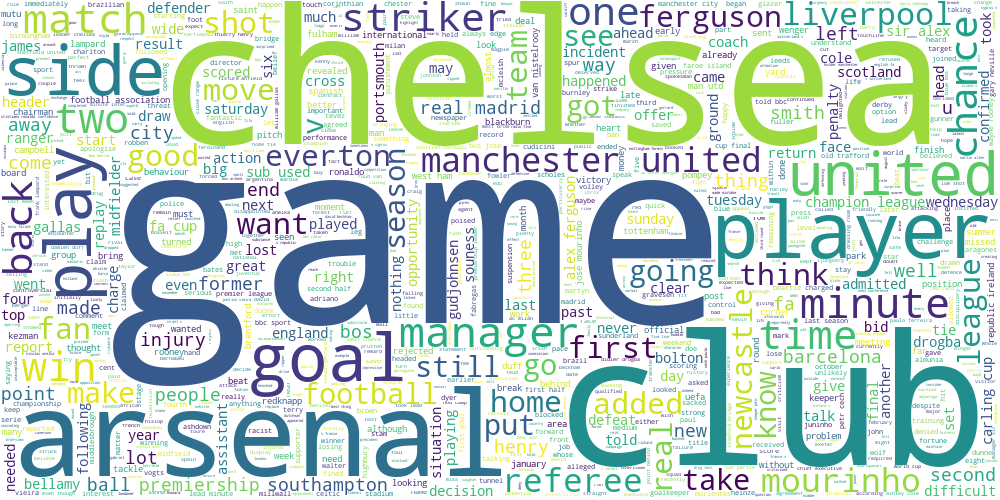

In [30]:
draw_wordcloud(data.text.values[np.argmax(lda_res, axis=1) == 4])

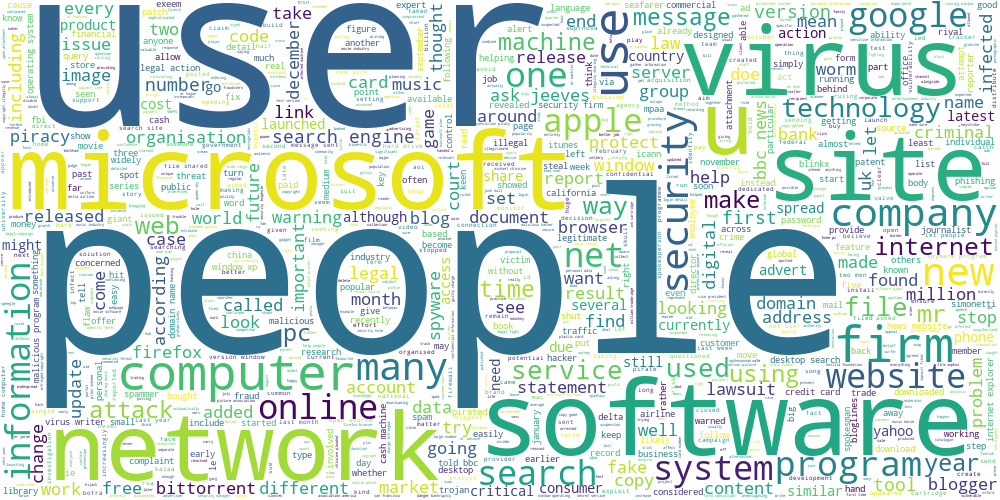

In [36]:
draw_wordcloud(data.text.values[np.argmax(lda_res, axis=1) == 10])

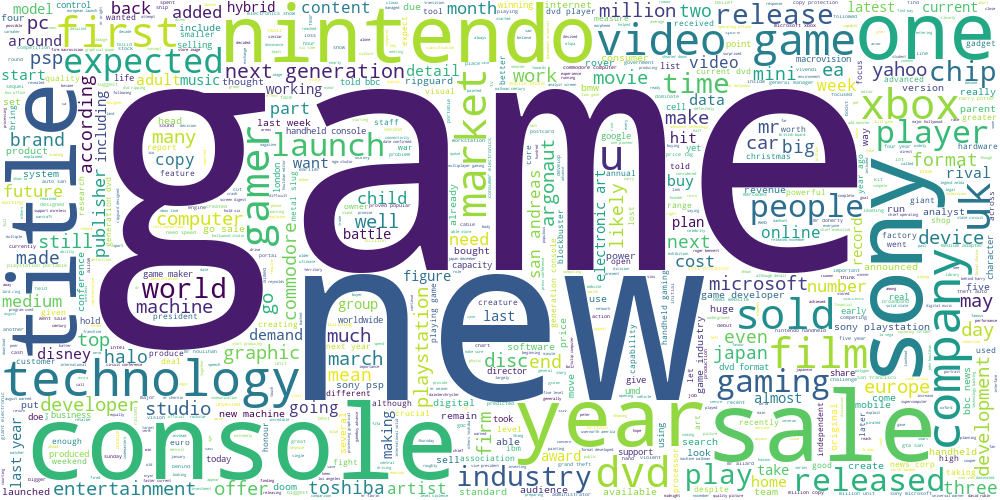

In [37]:
draw_wordcloud(data.text.values[np.argmax(lda_res, axis=1) == 11])

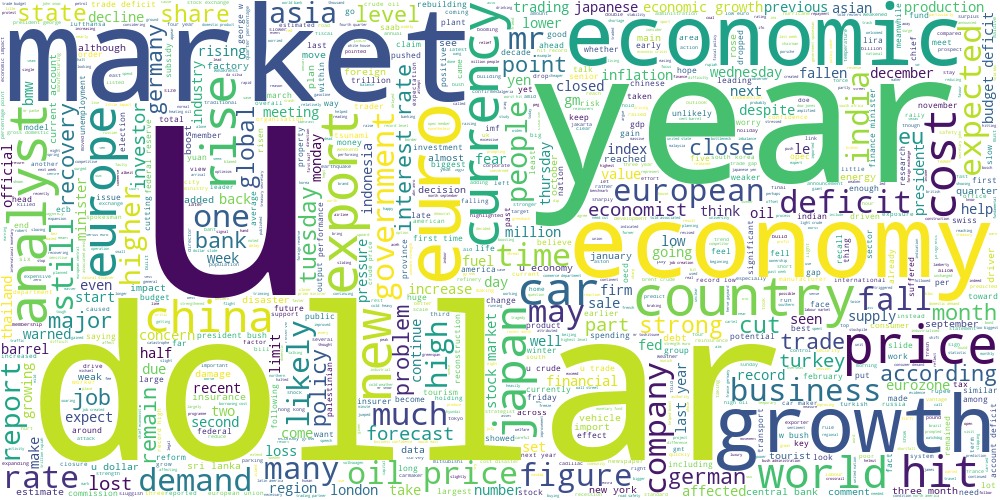

In [40]:
draw_wordcloud(data.text.values[np.argmax(lda_res, axis=1) == 13])

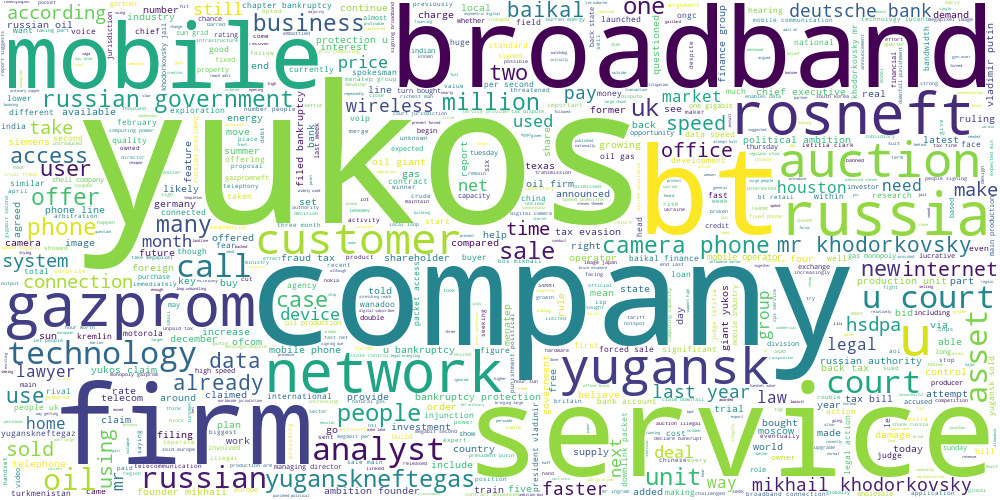

In [66]:
draw_wordcloud(data.text.values[lda_res[:, 1] > 0.5])

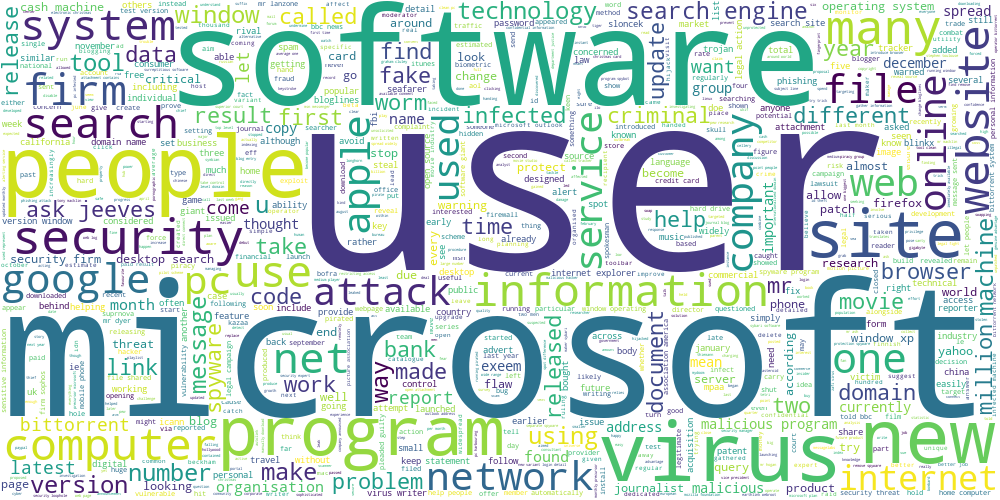

In [58]:
draw_wordcloud(data.text.values[lda_res[:, 10] > 0.5])

**Ваш ответ здесь:**

Если надо все документы распределить по темам, то в качестве кластера можно брать индекс наиболее вероятной темы. Если надо распределить документы по темам более точно, то можно считать, что документ принадлежит теме, если его вероятность принадлежности этой теме больше какого-то порога. Но в таком случае могут остаться некоторые документы без темы.

Да, темы получились более узкими, особенно это видно если отбирать тексты по порогу, а не по наиболее вероятной теме. Например, появились такие темы: футбол; россия, ее нефть и газ; Microsoft и ПО.

-----

## Часть 3. Transfer learning для задачи классификации текстов

**Замечание для всей части 3:**
* Для возможности получения **полного балла** accuracy всех алгоритмов на тесте должны быть не ниже 0.75, а также хотя бы один из рассмотренных в этой части алгоритмов должен достигнуть точности не менее 0.95 на тесте.

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей 🌚🌝. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

* **(0.4 балла)** Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.
* **(0.1 балла)** (?) У какой модели получилось лучшее качество? (?) С чем это связано?

**Подсказка:**
* Во второй модели расстояния до центров кластеров можно получиться при помощи метода KMeans.transform

**Ключевые слова:**
* *OrdinalEncoder, TfidfVectorizer, CountVectorizer, train_test_split, KMeans.transform*

In [67]:
data

,category,filename,title,content,raw_text,text
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...
...,...,...,...,...,...,...
2220,tech,397.txt,BT program to beat dialler scams,BT is introducing two initiatives to help bea...,BT program to beat dialler scams BT is introdu...,bt program beat dialler scam bt introducing tw...
2221,tech,398.txt,Spam e-mails tempt net shoppers,Computer users across the world continue to i...,Spam e-mails tempt net shoppers Computer users...,spam tempt net shopper computer user across wo...
2222,tech,399.txt,Be careful how you code,A new European directive could put software w...,Be careful how you code A new European directi...,careful code new european directive could put ...
2223,tech,400.txt,US cyber security chief resigns,The man making sure US computer networks are ...,US cyber security chief resigns The man making...,u cyber security chief resigns man making sure...


In [144]:
data_train, data_test, y_data_train, y_data_test = train_test_split(data.text, data.category, test_size=0.3)

In [146]:
enc = OrdinalEncoder()
y_train = enc.fit_transform(y_data_train.values[:, np.newaxis]).ravel()
y_test = enc.transform(y_data_test.values[:, np.newaxis]).ravel()

In [148]:
tfidf_vec = TfidfVectorizer(max_df=1.0, min_df=0.01, use_idf=True, smooth_idf=True, sublinear_tf=False)
X_train = tfidf_vec.fit_transform(data_train)
X_test = tfidf_vec.transform(data_test)

In [150]:
X_test.shape

(668, 2659)

In [151]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression()

In [152]:
(log_reg.predict(X_train).astype(np.int32) == y_train).sum() / y_train.shape[0]

0.9955041746949261

In [153]:
(log_reg.predict(X_test).astype(np.int32) == y_test).sum() / y_test.shape[0]

0.9805389221556886

In [154]:
np.unique(y_train)

array([0., 1., 2., 3., 4.])

In [155]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X_train)

KMeans(n_clusters=5)

In [156]:
log_reg = LogisticRegression()
log_reg.fit(kmeans.transform(X_train), y_train)

LogisticRegression()

In [157]:
(log_reg.predict(kmeans.transform(X_train)).astype(np.int32) == y_train).sum() / y_train.shape[0]

0.9094412331406551

In [158]:
(log_reg.predict(kmeans.transform(X_test)).astype(np.int32) == y_test).sum() / y_test.shape[0]

0.9011976047904192

In [159]:
lda = LatentDirichletAllocation(n_components=5)
count_vec = CountVectorizer(max_df=1.0, min_df=0.01)
X_train_count = count_vec.fit_transform(data_train)
X_test_count = count_vec.transform(data_test)

In [160]:
X_test_count.shape

(668, 2659)

In [161]:
log_reg = LogisticRegression()
log_reg.fit(lda.fit_transform(X_train_count), y_train)

LogisticRegression()

In [162]:
(log_reg.predict(lda.transform(X_train_count)).astype(np.int32) == y_train).sum() / y_train.shape[0]

0.9351316634553629

In [163]:
(log_reg.predict(lda.transform(X_test_count)).astype(np.int32) == y_test).sum() / y_test.shape[0]

0.9565868263473054

**Ваш ответ здесь:**

Лучшее качество получилось у логистической регрессии на tf-idf признаках.

Это связано с тем, что KMeans и LDA не привносят ничего нового, а только зашумляют данные.

-----

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры (tf-idf, bag_of_words) и алгоритмы кластеризации (KMeans)) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%).

* **(1.2 балла)** Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 
* **(0.3 балла)** (?) Как изменились результаты по сравнению с обучением на полной разметке? (?) Сделайте выводы.

**Пояснение:**
* Тестовую выборку возьмите из задания 3.1. А разделять надо тренировочную из 3.1
* Обучаете векторайзер на 70%, применяете векторайзер к 5%, и на этих 5% уже обучаете классификатор.
* Итак, берем 3 варианта обучения из задания 3.1. Вы должны:
 * 1-я модель. Подобрать оптимальный гиперпараметр С у LogisticRegression на tf-idf признаках. Выбираем оптимальный параметр по валидационной выборке. Далее оцениваем обученную модель с оптимальном параметром на тесте.
 * 2-я модель. Шаг 1. Подобрать оптимальный гиперпараметр n_clusters у KMeans на tf-idf признаках: перебираем значения n_clusters и при каждом значении обучаем LogisticRegression на дефолтных параметрах (быть может с ограничением max_iter, об этом ниже). То есть классификатор в данном случае будет на одинаковых параметрах для всех представителей семейства алгоритмов KMeans. Далее выбираете оптимальный n_clusters по качеству классификатора на валидационной выборке. Шаг 2. Обучаете KMeans с оптимальным n_clusters и перебираете значение C у LogisticRegression. Также выбираете оптмальное по валидации. И только после двух подобранных оптимальных параметров выводите качество на тесте.
 * 3-я модель. Аналогично второй, только вместо KMeans --- LatentDirichletAllocation, а вместо tf-idf -- bag of words.

**Замечания:**
* Параметр $С$ у LogisticRegression перебирайте *по логарифмической сетке.* Обратите внимание, что $С$ НЕ перед регуляризатором, поэтому, скорее всего, наиболее оптимальными будут большие значения $C$. **Для возможности получения полного балла** переберите хотя бы 20 параметров, и затроньте значения в 1e-2 и 1e6 (по большей части значения должны лежать в этом отрезке)
* **Для возможности получения полного балла** параметр n_clusters у KMeans при переборе должен затрагивать значения в 10 и 1000 кластеров (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не менее 20 значений кластеров *(по линейной сетке)*
* **Для возможности получения полного балла** параметр n_components у LDA при переборе должен затрагивать значения в 5 и 14 (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не меньше 10 различных значений *(по линейной сетке)*

**Подсказка:**
* Может быть для ограничения времени обучения лучше будет ограничить параметр max_iter в LogisticRegression, равным, например, 1000

In [164]:
data_train

333     u firm pull iraq u company pulled major contra...
260     booming market shed tear market former british...
79      argentina venezuela oil deal argentina venezue...
219     standard life concern lse bid standard life la...
1582    strachan turn pompey former southampton manage...
                              ...                        
770     brit return keane number one brit success help...
1606    london irish wasp wasp made light absence seve...
413     enron boss payout eighteen former enron direct...
452     u industrial output growth eas u industrial pr...
309     strong quarterly growth nike nike reported bes...
Name: text, Length: 1557, dtype: object

In [165]:
data_train_all, data_val, y_data_train_all, y_data_val = train_test_split(data_train, y_data_train, test_size=0.3)
data_train_ul, data_train_l, y_data_train_ul, y_data_train_l = train_test_split(data_train_all, y_data_train_all, test_size=0.07)

In [166]:
y_train_all = enc.transform(y_data_train_all.values[:, np.newaxis]).ravel()
y_val = enc.transform(y_data_val.values[:, np.newaxis]).ravel()
y_train_ul = enc.transform(y_data_train_ul.values[:, np.newaxis]).ravel()
y_train_l = enc.transform(y_data_train_l.values[:, np.newaxis]).ravel()

In [190]:
tfidf_vec = TfidfVectorizer(max_df=1.0, min_df=0.01, use_idf=True, smooth_idf=True, sublinear_tf=False)
X_train_all = tfidf_vec.fit_transform(data_train_all)
X_train_l = tfidf_vec.transform(data_train_l)
X_val = tfidf_vec.transform(data_val)
X_train_ul = tfidf_vec.transform(data_train_ul)
X_test = tfidf_vec.transform(data_test)

In [186]:
log_reg = LogisticRegression(C=1.0)
log_reg.fit(X_train_l, y_train_l)
(log_reg.predict(X_val) == y_val).sum() / y_val.shape[0]

0.6175213675213675

In [187]:
C_values = np.geomspace(1e-2, 1e6, 50)
acc_list = []
for c in C_values:
    log_reg = LogisticRegression(C=c)
    log_reg.fit(X_train_l, y_train_l)
    acc_list.append((log_reg.predict(X_val) == y_val).sum() / y_val.shape[0])

In [188]:
C_values[np.argmax(np.array(acc_list))]

323745.754281764

In [189]:
log_reg = LogisticRegression(C=323746)
log_reg.fit(X_train_l, y_train_l)
(log_reg.predict(X_test) == y_test).sum() / y_test.shape[0]

0.8502994011976048

In [192]:
k_values = np.arange(10, 1020, 50)
acc_list = []
for k in k_values:
    log_reg = LogisticRegression(max_iter=1000)
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X_train_all)
    log_reg.fit(kmeans.transform(X_train_l), y_train_l)
    acc_list.append((log_reg.predict(kmeans.transform(X_val)) == y_val).sum() / y_val.shape[0])

In [195]:
k = k_values[np.argmax(np.array(acc_list))]
kmeans = KMeans(n_clusters=k)
kmeans.fit(X_train_all)
C_values = np.geomspace(1e-2, 1e6, 50)
acc_list = []
for c in C_values:
    log_reg = LogisticRegression(C=c, max_iter=1000)
    log_reg.fit(kmeans.transform(X_train_l), y_train_l)
    acc_list.append((log_reg.predict(kmeans.transform(X_val)) == y_val).sum() / y_val.shape[0])

c:\users\илья\appdata\local\programs\python\python38\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\илья\appdata\local\programs\python\python38\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

In [199]:
c = C_values[np.argmax(np.array(acc_list))]
log_reg = LogisticRegression(C=c, max_iter=1000)
log_reg.fit(kmeans.transform(X_train_l), y_train_l)
(log_reg.predict(kmeans.transform(X_test)) == y_test).sum() / y_test.shape[0]

0.9401197604790419

In [200]:
count_vec = CountVectorizer(max_df=1.0, min_df=0.01)
X_train_all = count_vec.fit_transform(data_train_all)
X_train_l = count_vec.transform(data_train_l)
X_val = count_vec.transform(data_val)
X_train_ul = count_vec.transform(data_train_ul)
X_test = count_vec.transform(data_test)

In [201]:
k_values = np.arange(2, 21)
acc_list = []
for k in k_values:
    log_reg = LogisticRegression(max_iter=1000)
    lda = LatentDirichletAllocation(n_components=k)
    lda.fit(X_train_all)
    log_reg.fit(lda.transform(X_train_l), y_train_l)
    acc_list.append((log_reg.predict(lda.transform(X_val)) == y_val).sum() / y_val.shape[0])

In [204]:
k = k_values[np.argmax(np.array(acc_list))]
lda = LatentDirichletAllocation(n_components=k)
lda.fit(X_train_all)
C_values = np.geomspace(1e-2, 1e6, 50)
acc_list = []
for c in C_values:
    log_reg = LogisticRegression(C=c, max_iter=1000)
    log_reg.fit(lda.transform(X_train_l), y_train_l)
    acc_list.append((log_reg.predict(lda.transform(X_val)) == y_val).sum() / y_val.shape[0])

In [206]:
c = C_values[np.argmax(np.array(acc_list))]
log_reg = LogisticRegression(C=c, max_iter=1000)
log_reg.fit(lda.transform(X_train_l), y_train_l)
(log_reg.predict(lda.transform(X_test)) == y_test).sum() / y_test.shape[0]

0.9550898203592815

**Ваш ответ здесь:**

По сравнению с обучением на полной разметке очень сильно ухудшилось качество у логистической регрессии. Методы с применением KMeans и LDA показали намного лучшее качество на тесте по сравнению с логистической регрессией.

В случае ситуации слабой разметки, применение алгоритмов обучения без учителя (KMeans, LDA) дает намного лучшее итоговое качество модели по сравнению просто с обучением классификатора только на размеченной части данных. Так происходит потому что мы с пользой задействуем неразмеченную (и как правило бОльшую) часть данных.

-----

## Бонус

**Задание 4 (1 балл)**. 

* **(Максимум 0.8 балла, 0.4 балла за каждый исследованный метод)** Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. 
* **(0.2 балла)** (?) Получилось ли добиться лучшего качества? (?) Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. Существует метрика BCubed ([Ссылка 1](https://github.com/esokolov/ml-course-hse/blob/master/2020-spring/lecture-notes/lecture17-clusterization.pdf), [Ссылка 2](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf)), которая хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). 

* **(0.2 балла)** Реализуйте подсчет метрики BCubed
* **(0.8 балла)** (?) Сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

**Замечание:**
* Пользоваться готовыми библиотечными методами для вычисления BCubed нельзя

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Ваш ответ здесь:**

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии🧙.

* Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). (?) Напишите, откуда брали данные и что это за данные
* **(1.7 балла)** Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое.
* **(0.3 балла)** (?) Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! 

**Подсказка:**
* Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (0.05 балла)**. Опишите свои ощущения от этой домашки🥔, поощряется сравнение с предыдущей.

Ощущения приятные. Эта домашка намного легче предыдущей.